<a href="https://colab.research.google.com/github/harshitraj21/Dog_prediction/blob/main/dog_vision.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# End-to-end Multil-class Dog Breed Classification
This notebook builds an end-to-end multi-class image classifier using TensorFlow 2.x and TensorFlow Hub.

### 1. Problem
Identifying the breed of a dog given an image of a dog.

When I'm sitting at the cafe and I take a photo of a dog, I want to know what breed of dog it is.

### 2. Data
The data we're using is from Kaggle's dog breed identification competition.

https://www.kaggle.com/c/dog-breed-identification/data

### 3. Evaluation
The evaluation is a file with prediction probabilities for each dog breed of each test image.

https://www.kaggle.com/c/dog-breed-identification/overview/evaluation

### 4. Features
Some information about the data:

* We're dealing with images (unstructured data) so it's probably best we use deep learning/transfer learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ images in the training set (these images have labels).
* There are around 10,000+ images in the test set (these images have no labels, because we'll want to predict them).

### Get our workspace ready
* Import TensorFlow 2.x ✅
* Import TensorFlow Hub ✅
* Make sure we're using a GPU ✅

In [ ]:
# import Tensorflow
import tensorflow as tf
print("Tensorflow version", tf.__version__)

Tensorflow version 2.15.0


In [ ]:
import tensorflow_hub as hub
print("Tensorflow hub version", hub.__version__)

# Check for GPU availability
print("GPU", "available" if tf.config.list_physical_devices("GPU") else "not available")

Tensorflow hub version 0.16.1
GPU not available


### Getting our data ready (turning into Tensors)
With all machine learning models, our data has to be in numerical format. So that's what we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out the labels.

In [ ]:
import pandas as pd
labels_csv = pd.read_csv("drive/My Drive/Dog vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
len(labels_csv)

10222

In [ ]:
# How many images are there of each breed?
labels_csv["breed"].value_counts()

breed
scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: count, Length: 120, dtype: int64

<Axes: xlabel='breed'>

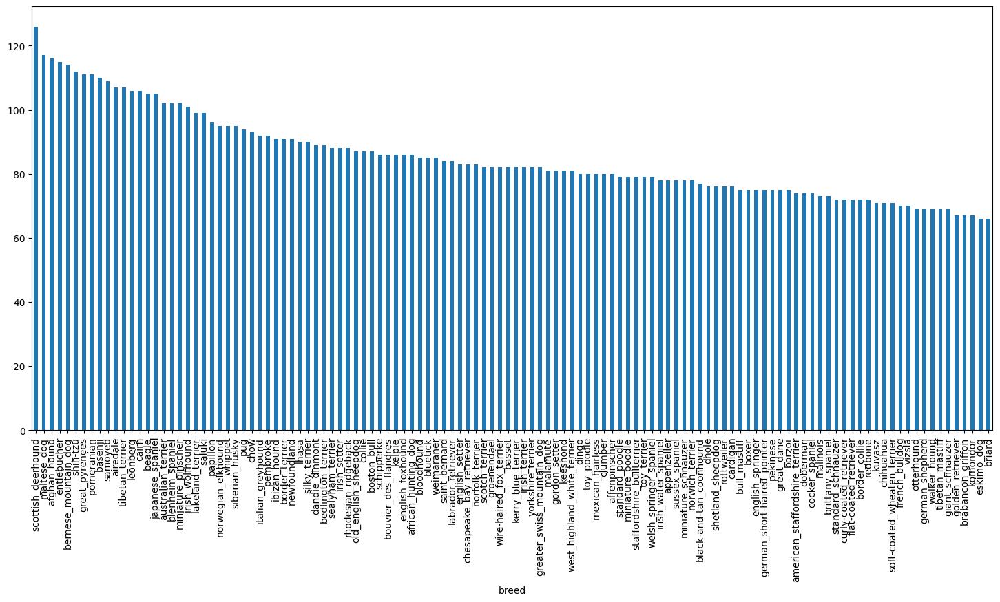

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(18, 8))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

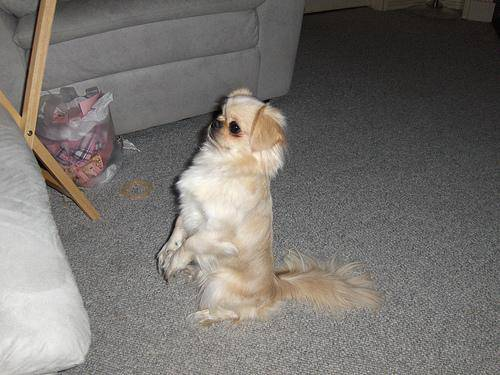

In [ ]:
from IPython.display import Image
Image("drive/My Drive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

In [ ]:
filenames = ["drive/My Drive/Dog vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/My Drive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/Dog vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/Dog vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/Dog vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/Dog vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/Dog vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/Dog vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/Dog vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/Dog vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/Dog vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
if (len(os.listdir("drive/My Drive/Dog vision/train"))==len(filenames)):
  print("Filenames matched with the actual number of files. Proceed!!!")
else:
  print("Filenames did not match with the actual number of files")

Filenames matched with the actual number of files. Proceed!!!


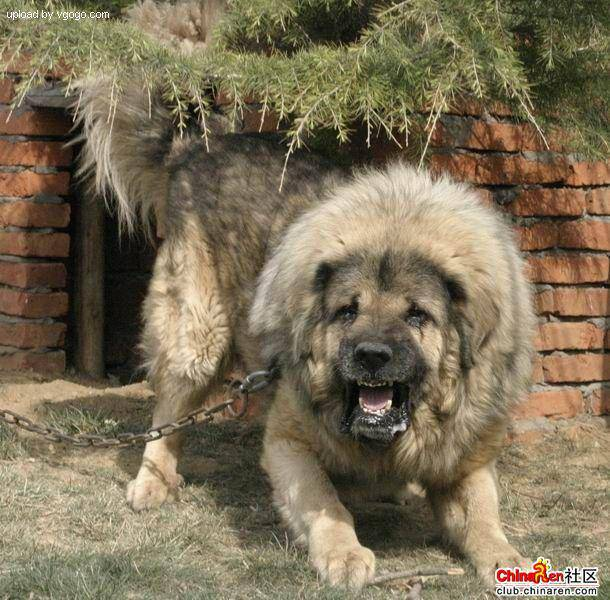

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv["breed"].iloc[9000]

'tibetan_mastiff'

In [ ]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
if(len(filenames) == len(labels)):
  print("Number of labels matches with the number of filenames")
else:
  print("Number of labels did not match with the number of filenames")

Number of labels matches with the number of filenames


In [ ]:
# Find the number of breeds
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
# Turn a single label into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into an array booleans
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])  # original label
print(np.where(unique_breeds == labels[0]))  # index where label occurs
print(boolean_labels[0].argmax())   # index where label occurs in boolean array
print(boolean_labels[0].astype(int))  # there will be a 1 where the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[3])
print(boolean_labels[3].argmax())
print(boolean_labels[3].astype(int))

bluetick
15
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


### Creating our own validation set
Since the dataset from Kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X and y variables
X = filenames
y = boolean_labels

We're going to start off experimenting with ~1000 images and increase as needed.

In [ ]:
NUM_IMAGES = 1000 #@param {type: "slider", min: 1000, max: 10000, step: 1000}

In [ ]:
from sklearn.model_selection import train_test_split
# Split them into training and validation of total size NUM_IMAGES

np.random.seed(42)
X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES], y[:NUM_IMAGES], test_size=0.2)

len(X_train), len(X_val), len(y_train), len(y_val)

(800, 200, 800, 200)

In [ ]:
X_train[:5], y_train[:3]

(['drive/My Drive/Dog vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/Dog vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/Dog vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/My Drive/Dog vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/My Drive/Dog vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, Fa

## Preprocessing Images (turning images into Tensors)
To preprocess our images into Tensors we're going to write a function which does a few things:

* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, image
* Turn our image (a jpg) into Tensors
* Normalize our image (convert color channel values from from 0-255 to 0-1).
* Resize the image to be a shape of (224, 224)
* Return the modified image
#### Before we do, let's see what importing an image looks like.

In [ ]:
# convert image into numpy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]], dtype=uint8)
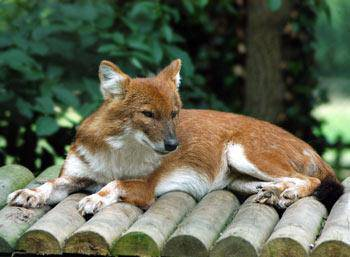

In [ ]:
image # It consists of arrays of pixel values (RGB) where max value is 255 and min value is 0

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
# turn image into a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

### Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them.

We'll create a function to:

* Take an image filepath as input
* Use TensorFlow to read the file and save it to a variable, image
* Turn our image (a jpg) into Tensors
* Normalize our image (convert color channel values from from 0-255 to 0-1).
* Resize the image to be a shape of (224, 224)
* Return the modified image
#### More information on loading images in TensorFlow can be seen here: https://www.tensorflow.org/tutorials/load_data/images

In [ ]:
# image size
IMG_SIZE = 128

def process_image(image_path, img_size=IMG_SIZE):
  '''
  Takes an image file path and turns the image into a Tensor.
  '''
  # Read an image path
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image, channels = 3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # Resize the image to our desired value (224, 224)
  image = tf.image.resize(image, size = [IMG_SIZE, IMG_SIZE])
  return image

### Turning our data into batches
Why turn our data into batches?

Let's say you're trying to process 10,000+ images in one go... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this: (image, label).

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the assosciated label,
  processes the image and reutrns a typle of (image, label).
  """
  image = process_image(image_path)
  return image, label

In [ ]:
# Demo of the above code
# tf.constant() -->> converts into a tensor
process_image(X[42]), tf.constant(y[42])

(<tf.Tensor: shape=(128, 128, 3), dtype=float32, numpy=
 array([[[0.27929032, 0.4751063 , 0.2795834 ],
         [0.27585176, 0.46525738, 0.26177704],
         [0.3406097 , 0.52753276, 0.30271655],
         ...,
         [0.2751685 , 0.49869794, 0.29869792],
         [0.28818935, 0.51209253, 0.31603253],
         [0.29382864, 0.52127963, 0.33304432]],
 
        [[0.21575989, 0.41348663, 0.2655423 ],
         [0.29273564, 0.48136288, 0.32789788],
         [0.3189494 , 0.505239  , 0.33296594],
         ...,
         [0.25343138, 0.47303924, 0.28489584],
         [0.2582874 , 0.4802207 , 0.2991575 ],
         [0.27520525, 0.49873468, 0.32627755]],
 
        [[0.1963847 , 0.39246315, 0.28385404],
         [0.2122244 , 0.4047182 , 0.29629302],
         [0.22513789, 0.41602883, 0.29334742],
         ...,
         [0.22732845, 0.44489893, 0.27724636],
         [0.23500296, 0.45068926, 0.2900581 ],
         [0.25955886, 0.47524515, 0.32041976]],
 
        ...,
 
        [[0.13864364, 0.17785932

#### Now we've got a way to turn our data into tuples of Tensors in the form: (image, label), let's make a function to turn all of our data (X & y) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(X, y = None, batch_size = BATCH_SIZE, valid_data = False, test_data = False):
  """
  Creates batches of data out of image (X) and label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, we probably don't have have labels
  if test_data:
    print("Creating test data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))    # only filepaths (no labels)
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches....")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))    # (filename, label)
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

  else:
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle(buffer_size = len(X))
    # Create (image, label) tuples (this also turns the iamge path into a preprocessed image) and turn the training data into batches
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
  return data_batch

In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches....
Creating validation data batches....


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

### Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """
  # Setup the figure
  plt.figure(figsize=(15, 10))

  # Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5, 5, i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])

    plt.axis("Off")

In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[0.7214461 , 0.63909316, 0.56458336],
          [0.7214461 , 0.63909316, 0.56458336],
          [0.7206648 , 0.63831186, 0.56380206],
          ...,
          [0.19857778, 0.2361084 , 0.35210538],
          [0.16634475, 0.20948201, 0.33117318],
          [0.15168984, 0.19482711, 0.31651828]],
 
         [[0.7137255 , 0.6313726 , 0.5568628 ],
          [0.7137255 , 0.6313726 , 0.5568628 ],
          [0.70654106, 0.6241881 , 0.5496783 ],
          ...,
          [0.19783768, 0.23663859, 0.3479284 ],
          [0.19295774, 0.23609501, 0.35018814],
          [0.13468018, 0.17781745, 0.2919106 ]],
 
         [[0.72954965, 0.6471967 , 0.5726869 ],
          [0.7223806 , 0.64002764, 0.56551784],
          [0.734954  , 0.65260106, 0.57809126],
          ...,
          [0.20732231, 0.24877453, 0.34793198],
          [0.13999455, 0.18705338, 0.28901416],
          [0.16752452, 0.21458335, 0.31654415]],
 
         ...,
 
         [[0.74982727, 0.65963113, 0.59688604],
          [0.70759

In [ ]:
len(train_images), len(train_labels)

(32, 32)

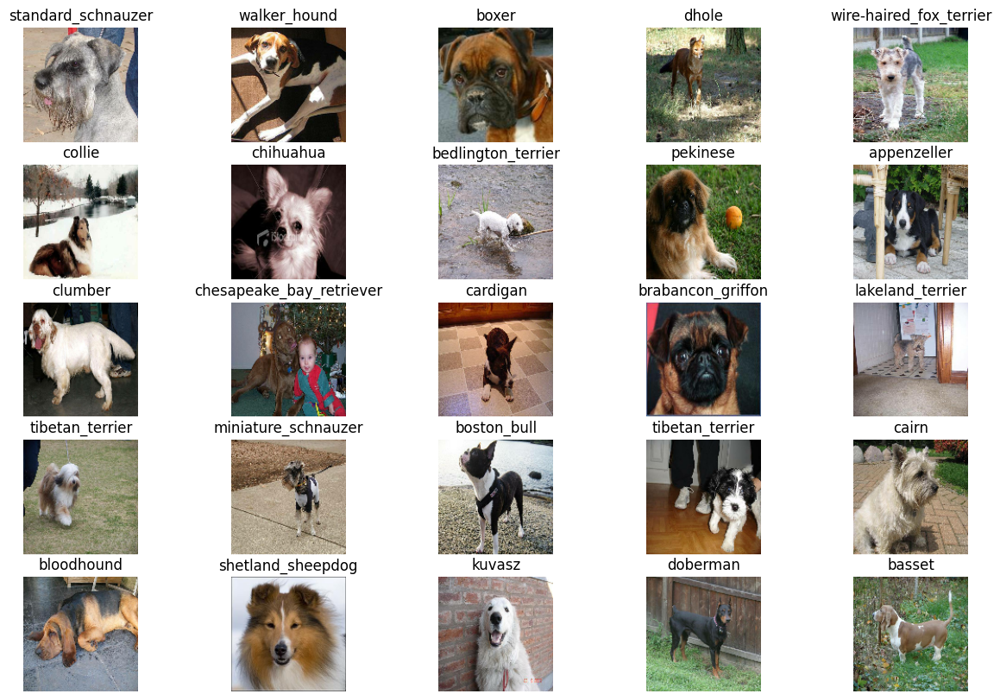

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

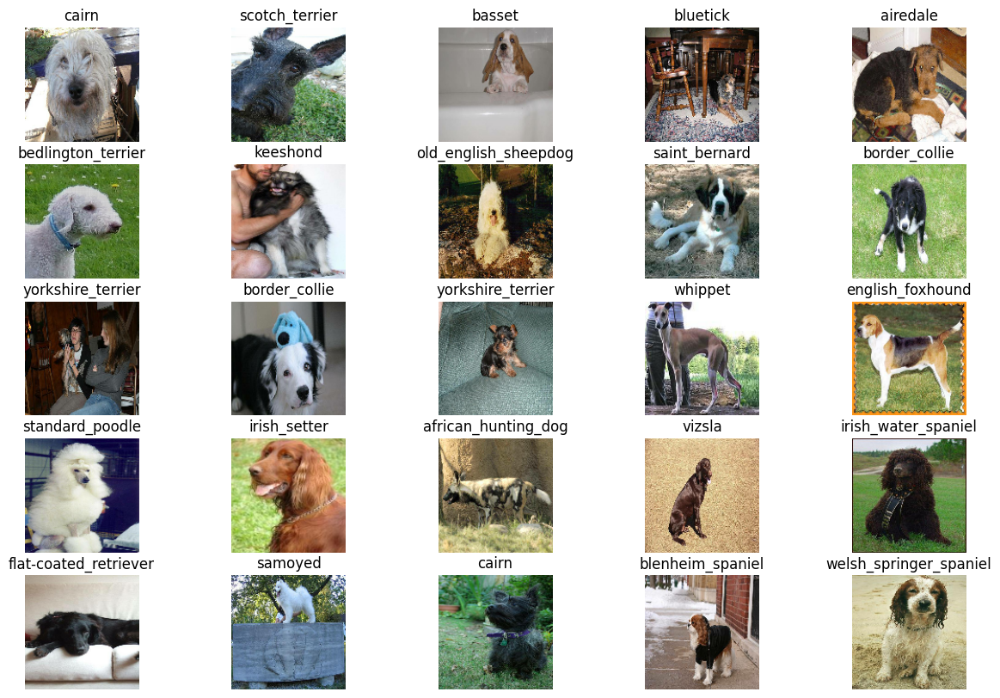

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

### Building a model
Before we build a model, there are a few things we need to define:

The input shape (our images shape, in the form of Tensors) to our model.
The output shape (image labels, in the form of Tensors) of our model.
The URL of the model we want to use from TensorFlow Hub - https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
IMG_SIZE

128

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]   #batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2"

In [ ]:
INPUT_SHAPE

[None, 128, 128, 3]

### Now we've got our inputs, outputs and model ready to go. Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:
* Takes the input shape, output shape and the model we've chosen as parameters.
* Defines the layers in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.
#### All of these steps can be found here: https://www.tensorflow.org/guide/keras/overview

In [ ]:
# Create a function which builds a Keras model
def create_model(input_shape = INPUT_SHAPE, output_shape = OUTPUT_SHAPE, model_url = MODEL_URL):
  print("Building model with ", MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
     hub.KerasLayer(MODEL_URL),     # Layer 1 (input layer)
     tf.keras.layers.Dense(units = OUTPUT_SHAPE, activation = "softmax")   # Layer 2 (output layer)
  ])

## Layer 1(Base Layer) is made, the model is such that it passes through multiple layers and
## layer 2 is the last layer after transformation with lesser size(shape) viz, specified as OUTPUT_SIZE

  # Compile the model
  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  # Build the model
  model.build(INPUT_SHAPE)
  return model

In [ ]:
model = create_model()
model.summary()

Building model with  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              1692489   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 1812729 (6.92 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 1692489 (6.46 MB)
_________________________________________________________________


### Creating callbacks
Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our models progress and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback
To setup a TensorBoard callback, we need to do 3 things:

* Load the TensorBoard notebook extension ✅
* Create a TensorBoard callback which is able to save logs to a directory and pass it to our model's fit() function. ✅
* Visualize our models training logs with the %tensorboard magic function (we'll do this after model training).
https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/TensorBoard

In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

def create_tensorboard_callback():
  logdir = os.path.join("drive/My Drive/Dog vision/logs", datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback
Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "val_accuracy", patience = 3)

### Training a model (on subset of data)
Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100  #@param {type: "slider", min: 10, max: 100, step: 10}

# 100 epochs means that it will give 100 chances to go through the
# training data set and figure out the patterns

### Let's create a function which trains a model.

* Create a model using create_model()
* Setup a TensorBoard callback using create_tensorboard_callback()
* Call the fit() function on our model passing it the training data, validation data, number of epochs to train for (NUM_EPOCHS) and the callbacks we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model
def train_model():
  """
  Trains a given model and returns the trained version.
  """
  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x = train_data,
            epochs = NUM_EPOCHS,
            validation_data = val_data,
            validation_freq = 1,
            callbacks = [tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

# It will train for 25 steps because we have 800 images -->> 800/32 = 25
# It will validate for 7 steps because we have 200 images -->> 200/32 = 6.25 = 7

Building model with  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2
Epoch 1/100
25/25 [==============================] - 329s 13s/step - loss: 5.8502 - accuracy: 0.0325 - val_loss: 4.6352 - val_accuracy: 0.0900
Epoch 2/100
25/25 [==============================] - 9s 374ms/step - loss: 2.5336 - accuracy: 0.3537 - val_loss: 3.6657 - val_accuracy: 0.2050
Epoch 3/100
25/25 [==============================] - 7s 280ms/step - loss: 1.1502 - accuracy: 0.7500 - val_loss: 3.4017 - val_accuracy: 0.2300
Epoch 4/100
25/25 [==============================] - 9s 355ms/step - loss: 0.5341 - accuracy: 0.9287 - val_loss: 3.3730 - val_accuracy: 0.2400
Epoch 5/100
25/25 [==============================] - 8s 315ms/step - loss: 0.2842 - accuracy: 0.9937 - val_loss: 3.3775 - val_accuracy: 0.2200
Epoch 6/100
25/25 [==============================] - 9s 365ms/step - loss: 0.1747 - accuracy: 1.0000 - val_loss: 3.3976 - val_accuracy: 0.2250
Epoch 7/100
25/25 [===============

Question: It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

Note: Overfitting to begin with is a good thing! It means our model is learning!!!

### Checking the TensorBoard logs
The TensorBoard magic function (%tensorboard) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions = model.predict(val_data, verbose = 1)
predictions

7/7 [==============================] - 2s 166ms/step


array([[1.9609737e-03, 2.8743559e-02, 1.2587251e-05, ..., 3.1484353e-05,
        7.2443890e-03, 4.7557326e-03],
       [5.7062498e-05, 9.0650377e-05, 3.0583769e-02, ..., 6.3033476e-05,
        2.4285261e-03, 1.9961958e-04],
       [6.4548192e-07, 1.7008124e-03, 1.3095041e-05, ..., 1.3875009e-02,
        3.2676890e-05, 3.2711033e-02],
       ...,
       [3.4855284e-06, 6.6083652e-05, 5.3190403e-03, ..., 3.6907270e-05,
        5.5092457e-04, 1.6333344e-03],
       [1.4655670e-04, 4.1645276e-03, 2.2207073e-06, ..., 7.9219302e-05,
        1.7824132e-05, 2.2200457e-04],
       [1.3724017e-06, 1.6095708e-03, 4.6804409e-05, ..., 6.5566140e-04,
        1.9792235e-03, 4.0177515e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
predictions[0]

array([1.96097372e-03, 2.87435595e-02, 1.25872511e-05, 1.59278861e-03,
       5.88577765e-04, 2.59009648e-05, 1.94873661e-04, 1.49994530e-05,
       5.41736335e-05, 3.77495657e-04, 5.90028591e-04, 3.33661656e-03,
       6.48261630e-05, 2.52234924e-04, 2.27672048e-04, 2.18080982e-04,
       2.85939575e-04, 4.10461519e-03, 1.28457381e-03, 3.48469621e-06,
       1.21213763e-03, 9.68556124e-05, 1.99242913e-05, 5.05781360e-03,
       3.25289730e-05, 4.07995394e-05, 6.91715535e-03, 5.43157694e-06,
       1.11718324e-03, 5.67753777e-05, 3.78183729e-04, 3.52357118e-03,
       5.46706084e-04, 4.97970286e-05, 1.04762951e-03, 3.30795068e-03,
       3.28149895e-06, 1.90735100e-05, 2.07335223e-04, 1.27296516e-04,
       4.03753817e-02, 3.93740993e-05, 2.55405030e-06, 1.68740153e-04,
       3.60588863e-04, 9.72637208e-05, 4.54223336e-05, 9.54920615e-05,
       5.54640498e-03, 4.21007804e-04, 3.11390730e-04, 1.24558428e-04,
       1.80454887e-02, 9.29467660e-06, 3.13991077e-05, 4.86002648e-07,
      

In [ ]:
np.sum(predictions[0])

1.0

In [ ]:
np.sum(predictions[1])

1.0

In [ ]:
# First prediction
index = 90
print(predictions[index])
print(f"Maximum value(probability of prediction: {np.max(predictions[index])})")
print(f"Sum: {np.sum(predictions[index])}")
print(f"The index at which the max value occurs: {np.argmax(predictions[index])}")
print(f"The predicted label is: {unique_breeds[np.argmax(predictions[index])]}")

[6.85281520e-08 3.72056462e-07 8.46026960e-05 1.53905839e-05
 1.47269193e-05 5.92030922e-08 3.86288903e-08 9.99909316e-05
 2.40726629e-03 1.47590326e-05 5.66611998e-03 1.10898986e-06
 5.82145231e-06 3.93520531e-05 3.30939147e-05 3.65430349e-03
 4.87083128e-07 9.17193290e-08 2.73369928e-03 1.67217822e-05
 3.49626703e-07 4.61857812e-03 2.01083685e-06 9.44191125e-09
 2.49232375e-03 3.90818150e-06 2.53869234e-06 3.91137146e-05
 9.66479163e-08 7.11153291e-07 6.51900223e-08 8.03397484e-07
 8.83006862e-07 1.79593771e-04 2.32288059e-07 1.80960228e-06
 9.65463623e-05 2.69379743e-05 5.11583096e-07 9.38170373e-01
 1.14127843e-05 9.87209660e-07 2.33063929e-06 2.30734404e-05
 1.37290078e-06 2.60050797e-07 7.35424464e-07 2.24741034e-05
 5.73119330e-08 3.45364679e-05 2.60444835e-06 2.66898787e-05
 7.38614517e-06 7.43149576e-05 1.92129249e-07 1.26004231e-03
 1.17382501e-06 8.13733004e-06 5.56950624e-07 9.82286201e-06
 1.91783110e-05 1.78638729e-03 2.03307053e-07 1.57937265e-07
 1.30903057e-08 5.649323

Having the the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the image the prediction is being made on!

Note: Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probabilities into their respective label (easier to understand)
def get_pred_label(prediction_prob):
  '''
  Turns an array of prediction probabilities into a predicted label
  '''
  return unique_breeds[np.argmax(prediction_prob)]

# Get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[81])
pred_label

'west_highland_white_terrier'

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  '''
  Takes a batched dataset of (image, label) tuples and returns separate arrays
  for images and labels.
  '''
  images_=[]
  labels_=[]
  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])
  return images_, labels_


In [ ]:
val_images, val_labels = unbatchify(val_data)
val_images[90], val_labels[90]

(array([[[0.2239076 , 0.18329264, 0.20556092],
         [0.19539843, 0.1578532 , 0.18629965],
         [0.10286627, 0.08572041, 0.11534113],
         ...,
         [0.55888486, 0.5157476 , 0.3902574 ],
         [0.55533093, 0.51611525, 0.37886032],
         [0.5431986 , 0.5039829 , 0.36381742]],
 
        [[0.30174682, 0.26974645, 0.2868425 ],
         [0.43885908, 0.4121113 , 0.4367743 ],
         [0.21729068, 0.20365469, 0.23223928],
         ...,
         [0.58241427, 0.539277  , 0.4137868 ],
         [0.57908934, 0.53987366, 0.4026188 ],
         [0.567739  , 0.5285233 , 0.3883579 ]],
 
        [[0.18843086, 0.17221825, 0.17952953],
         [0.4569925 , 0.4424398 , 0.45913714],
         [0.34478596, 0.33865848, 0.3633859 ],
         ...,
         [0.5798101 , 0.53667283, 0.41118264],
         [0.5775264 , 0.53700745, 0.40366238],
         [0.5697304 , 0.5305147 , 0.39034933]],
 
        ...,
 
        [[0.39811152, 0.3588958 , 0.25301346],
         [0.4509498 , 0.4117341 , 0.30585

In [ ]:
get_pred_label(predictions[90])

'english_foxhound'

### Now we've got ways to get get:

* Prediction labels
* Validation labels (truth labels)
* Validation images
Let's make some function to make these all a bit more visaulize.

### We'll create a function which:

* Takes an array of prediction probabilities, an array of truth labels and an array of images and an integer. ✅
* Convert the prediction probabilities to a predicted label. ✅
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot. ✅

In [ ]:
def plot_pred(prediction_probability, label, image, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probability[n], label[n], image[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}" .format(
      pred_label,
      np.max(pred_prob)*100,
      true_label) ,
            color = color)

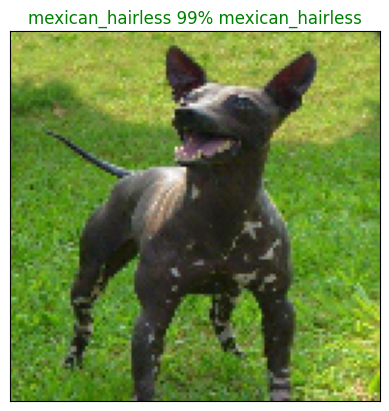

In [ ]:
plot_pred(predictions, val_labels, val_images, n=70)

### Now we've got one function to visualize our models top prediction, let's make another to view our models top 10 predictions.

This function will:

* Take an input of prediction probabilities array and a ground truth array and an integer ✅
* Find the prediction using get_pred_label() ✅
* Find the top 10:
  1. Prediction probabilities indexes ✅
  2.  Prediction probabilities values ✅
  3. Prediction labels ✅
* Plot the top 10 prediction probability values and labels, coloring the true label green ✅

In [ ]:
def plot_pred_conf(prediction_probability, labels, n=1):
  """
  Plots the top 10 prediction with their probabilities and ground truth
  """
  pred_prob, true_label = prediction_probability[n], labels[n]

  pred_label = get_pred_label(pred_prob)
  top_10_pred_index = pred_prob.argsort()[-10:][: : -1]
  top_10_pred_values = pred_prob[top_10_pred_index]
  top_10_pred_labels = unique_breeds[top_10_pred_index]

  top_10_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                        top_10_pred_values,
                        color = "red")

  plt.xticks(np.arange(len(top_10_pred_labels)),
             top_10_pred_labels,
             rotation = "vertical")

  if np.isin(true_label, top_10_pred_labels):
    top_10_plot[np.argmax(true_label == top_10_pred_labels)].set_color("green")

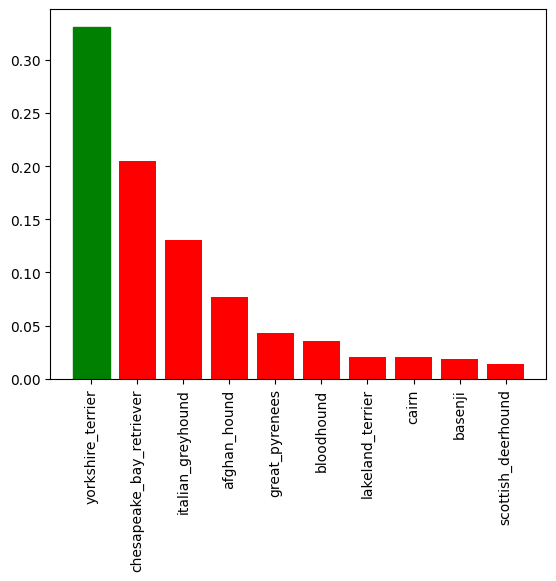

In [ ]:
plot_pred_conf(predictions, val_labels, n=10)

Now we've got some function to help us visualize our predictions and evaluate our modle, let's check out a few.

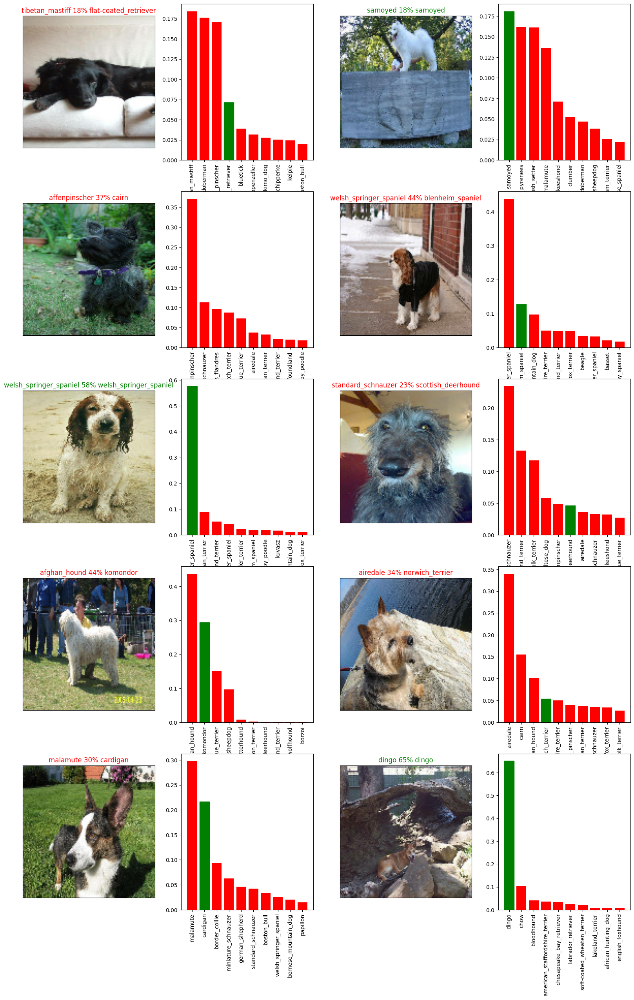

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 20
num_rows = 5
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(4*num_rows, 15*num_cols))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(predictions, val_labels, val_images, n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(predictions, val_labels, n=i+i_multiplier)

#plt.tight_layout(h_pad = 1.0)
plt.show()

## Saving and reloading a trained model

In [ ]:
def save_model(model, suffix = None):
  '''
  Saves a given model in a format so it can be downloaded
  '''
  modeldir = os.path.join("drive/My Drive/Dog vision/models",
                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + '.h5'
  print(f"Saving model to {model_path}")
  model.save(model_path)
  return model_path

In [ ]:
def load_model(model_path):
  '''
  Loads a saved model from a path
  '''
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                     custom_objects = {"KerasLayer": hub.KerasLayer})
  return model

In [ ]:
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to drive/My Drive/Dog vision/models/20240608-065350-1000-images-mobilenetv2-Adam.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog vision/models/20240608-065350-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a trained model
loaded_model = load_model('drive/MyDrive/Dog vision/models/20240608-065350-1000-images-mobilenetv2-Adam.h5')

Loading saved model from: drive/MyDrive/Dog vision/models/20240608-065350-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 3s 304ms/step - loss: 3.4362 - accuracy: 0.2450


[3.4362494945526123, 0.24500000476837158]

In [ ]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 4s 254ms/step - loss: 3.4362 - accuracy: 0.2450


[3.4362494945526123, 0.24500000476837158]

## **`Training a big dog model 🐶 (on the full data)`**

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
len(X_train)

800

In [ ]:
full_data = create_data_batches(X, y)

Creating training data batches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
len(full_data)

320

In [ ]:
full_model = create_model()

Building model with  https://www.kaggle.com/models/google/mobilenet-v2/TensorFlow2/035-128-classification/2


In [ ]:
full_model_tensorboard = create_tensorboard_callback()
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor = "accuracy",
                                                             patience=3)

In [ ]:
full_model.fit(x = full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 2818s 9s/step - loss: 2.8793 - accuracy: 0.3274
Epoch 2/100
320/320 [==============================] - 80s 248ms/step - loss: 1.6351 - accuracy: 0.5546
Epoch 3/100
320/320 [==============================] - 80s 250ms/step - loss: 1.2749 - accuracy: 0.6415
Epoch 4/100
320/320 [==============================] - 81s 253ms/step - loss: 1.0318 - accuracy: 0.7052
Epoch 5/100
320/320 [==============================] - 79s 247ms/step - loss: 0.8475 - accuracy: 0.7482
Epoch 6/100
320/320 [==============================] - 83s 259ms/step - loss: 0.7061 - accuracy: 0.7898
Epoch 7/100
320/320 [==============================] - 83s 260ms/step - loss: 0.5926 - accuracy: 0.8309
Epoch 8/100
320/320 [==============================] - 80s 249ms/step - loss: 0.5034 - accuracy: 0.8558
Epoch 9/100
320/320 [==============================] - 83s 258ms/step - loss: 0.4322 - accuracy: 0.8831
Epoch 10/100
320/320 [==============================] - 78s 242ms

In [ ]:
save_model(full_model, suffix="full_data")

Saving model to drive/My Drive/Dog vision/models/20240608-092644-full_data.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog vision/models/20240608-092644-full_data.h5'

In [ ]:
model_load = load_model("drive/MyDrive/Dog vision/models/20240608-092644-full_data.h5")

Loading saved model from: drive/MyDrive/Dog vision/models/20240608-092644-full_data.h5


### Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

Luckily we created create_data_batches() earlier which can take a list of filenames as input and conver them into Tensor batches.

To make predictions on the test data, we'll:

* Get the test image filenames. ✅
* Convert the filenames into test data batches using create_data_batches() and setting the test_data parameter to True (since the test data doesn't have labels). ✅
* Make a predictions array by passing the test batches to the predict() method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/My Drive/Dog vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/Dog vision/test/e519e383a6efec0abd285beda04aeac9.jpg',
 'drive/My Drive/Dog vision/test/e5b13519aa192a386dc0c5dd7d096e70.jpg',
 'drive/My Drive/Dog vision/test/e1967a2e9c507c256b83a1e2e4f4e941.jpg',
 'drive/My Drive/Dog vision/test/e7ce78e874945f182a4f5149aa505b09.jpg',
 'drive/My Drive/Dog vision/test/e061b8d24e7b1324a6ac92ae81fdda19.jpg',
 'drive/My Drive/Dog vision/test/e60f6620bf8751538db9006d425f1b45.jpg',
 'drive/My Drive/Dog vision/test/dce8d03553ab29570f67a28bf0ee0709.jpg',
 'drive/My Drive/Dog vision/test/e47de0441a48f2eff7c2faacd350ed06.jpg',
 'drive/My Drive/Dog vision/test/e2f853c8345758faf5d9b2075f196fd3.jpg',
 'drive/My Drive/Dog vision/test/e1adb64372b1784c01401cb73bb20807.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches....


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions = model_load.predict(test_data, verbose=1)

324/324 [==============================] - 3183s 10s/step


In [ ]:
test_predictions[0]

array([1.92454774e-10, 3.01095537e-11, 7.10921515e-19, 4.61536183e-16,
       3.88825363e-08, 2.17785910e-14, 6.90333374e-17, 2.27348487e-16,
       1.03540156e-10, 6.27489287e-18, 4.94512658e-15, 4.56265993e-13,
       6.32869104e-11, 2.74861069e-15, 5.61280758e-14, 6.81173181e-15,
       5.47906664e-10, 1.20607086e-17, 6.64169386e-10, 7.09126022e-11,
       8.82406648e-12, 2.51786925e-11, 4.19002398e-13, 1.81075634e-08,
       3.75770629e-16, 1.22758093e-09, 3.90383933e-14, 4.74840410e-11,
       3.84757295e-05, 7.19803774e-12, 4.45573445e-09, 8.55347846e-15,
       5.68195517e-08, 2.83706489e-13, 4.54844495e-13, 2.93393917e-15,
       2.46475752e-17, 6.86082367e-19, 2.93910833e-08, 2.52281746e-21,
       6.15831930e-13, 1.60570904e-10, 3.01071641e-17, 1.59629671e-11,
       9.98150229e-01, 8.76411974e-08, 2.17708698e-10, 1.59972296e-05,
       5.89316187e-06, 4.30437512e-14, 1.46187160e-11, 2.09860787e-08,
       1.83598620e-13, 2.01906178e-12, 1.03100162e-09, 6.55720021e-16,
      

In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 128, 128, 3), dtype=tf.float32, name=None)>